# LONG Yongkang

# Style-Transfer and Texture Synthesis

In this project, the goal is to reimplement certain aspects of <b>three</b> papers for style transfer and texture synthesis.

# Image Style Transfer Using Convolutional Neural Networks [1]

The goal of the approach described in [1] is to transfer the style of a style image $\vec{a}$ to a content image $\vec{p}$ by gradually applying changes to a target image $\vec{x}$ that is initially showing white noise (or for performance reasons the content image $\vec{p}$) such that $\vec{x}$ converges to an image that shows the content of $\vec{p}$ (e.g. KAUST) in the style of $\vec{a}$ (similar colors, brush strokes etc.) (cf. figure below) Details about the method are provided in the paper [1] and in Appendix A.

<center><img src='img/overview.jpg' width=80% /></center>

## Library imports and definition of some helper functions (do not change anything)

In [1]:
# import all needed resources
%matplotlib inline

from PIL import Image
from io import BytesIO
import os
import math
import matplotlib.pyplot as plt
import numpy as np
import time
import sys

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset
import requests
from torchvision import transforms, models


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
torch.cuda.get_device_name()

'Tesla V100-SXM2-32GB'

In [4]:
def load_image(img_path, max_size = 400, shape = None):
    
    ''' Load and downscale an image if the shorter side is longer than <max_size> px '''
    
    if "http" in img_path:
        response = requests.get(img_path)
        image = Image.open(BytesIO(response.content)).convert('RGB')
    else:
        image = Image.open(img_path).convert('RGB')
    
    if min(image.size) > max_size:
        size = max_size
    else:
        size = min(image.size)
    
    if shape is not None:
        size = shape
    
    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), 
                                             (0.229, 0.224, 0.225))])

    # discard alpha channel (:3) and append the batch dimension (unsqueeze(0))
    image = in_transform(image)[:3,:,:].unsqueeze(0)
    
    return image

In [5]:
# helper function for un-normalizing an image 
# and converting it from a Tensor image to a NumPy image for display
def im_convert(tensor):
    """ Convert a PyTorch tensor to a NumPy image. """
    
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

In [47]:
''' Define and load corresponding content/style pairs '''

content_files = ['kaust', 'tesla', 'hamilton', 'mandela']
style_files = ['starry_night', 'jesuiten', 'scream', 'ben_passmore']
ref_vgg_files = ['vgg0_ref', 'vgg1_ref', 'vgg2_ref', 'vgg3_ref']
ref_resnet_files = ['res0_ref', 'res1_ref', 'res2_ref', 'res3_ref']

# load in content and style images
content = [load_image('img/content/' + c + '.jpg').to(device) for c in content_files]

# Resize style images to match corresponding content, makes code easier
style = [load_image('img/style/' + s + '.jpg', shape=content[n].shape[-2:]).to(device) for n, s in enumerate(style_files)]

# Reference Solution
ref_vgg =  [load_image('img/ref/' + c + '.jpg').to(device) for c in ref_vgg_files]

# Create Target image and prepare it for change (requires_grad_(True))
# Starting with the content image and applying the style is usually faster than starting from a random image

# Target Image = Content Image
target = [c.clone().requires_grad_(True).to(device) for c in content]

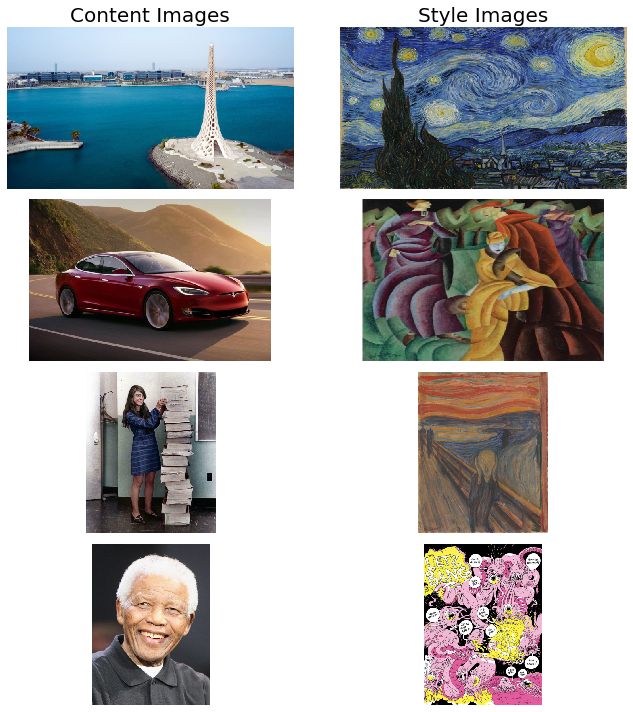

In [94]:
# display the images
num_pairs = len(content)
fig, axs = plt.subplots(num_pairs, 2, figsize=(10, 10))

axs[0, 0].set_title('Content Images', fontsize=20)
axs[0, 1].set_title('Style Images', fontsize=20)
#axs[0, 2].set_title('Target Images', fontsize=20)

# content and correspoinding style image side-by-side
for row in range(0, num_pairs):
        axs[row, 0].imshow(im_convert(content[row]))
        axs[row, 1].imshow(im_convert(style[row]))
        #axs[row, 2].imshow(im_convert(target[row]))

        for col in range(0, 2):
            axs[row, col].axis('off')
        
fig.tight_layout()
plt.show()

In [6]:
def get_features(image, model, layers):
    # Run an image forward through a model and get the features for a set of layers.
        
    features = {}
    x = image
    # model._modules is a dictionary holding each module in the model
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
            
    return features

## Task 1: Calculate the $d \times d$ gram matrix corresponding to a $1 \times d \times h \times w$ tensor (5 points)

As described in [1], the style of an image can be represented by the Gram matrix of a layer consisting of a set of features maps. Ensure that the computation also works for batch sizes > 1 and that the result is a 4d rensor.

In [7]:
def gram_matrix(tensor, normalize = False):
    """ Calculate the Gram Matrix of a given tensor 
        Gram Matrix: https://en.wikipedia.org/wiki/Gramian_matrix
    """
    
    # TODO Task 1: Implement the computation of the Gram Matrix
    
    ## get the batch_size b, depth c, height h, and width w of the Tensor
    ## reshape it, so we're multiplying the features for each channel
    ## calculate the gram matrix
    b,c, h, w = tensor.size()
    tensor = tensor.view(b*c, h * w)
    gram = torch.mm(tensor, tensor.t())
    
    ## if normalize = True, normalize the gram matrix as it is done in Equation 3 of [5]
    if normalize == True:
         gram.div(b * c * h * w)
    #gram = None
    
    return gram

## Task 2: Complete the Training Function (10 points)

In order to complete this task, you might want to refer to the paper [1] and to the Appendix A. Note that the equations in Appendix A slightly differ from the originals in the paper. However, we highly recommend the equations in Appendix A since the equations in the paper seem to be inconsistent to the original implementation of the authors and are obviously missing normalization.

In [8]:
def run_model(model, layers, target, content_features, style_grams, content_layer, style_weights, content_weight = 1, style_weight = 1.0e12, steps = 5000, lr = 0.003):
    
    # for displaying the loss values, intermittently
    show_every = 500

    # iteration hyperparameters
    optimizer = optim.Adam([target], lr=lr)
    
    # Values of the learning curve
    learning_curve = np.zeros(steps)
    
    print(learning_curve.shape)

    start = time.time()

    for ii in range(1, steps+1):

        ## TODO Task 2: get the features from the target image w.r.t. the provided model and the required layers
        target_features =  get_features(target, model,layers)
        
        ## TODO Task 2: calculate the content loss (refer to Appendix A for details about the formula)
        content_loss = torch.mean((target_features[content_layer] -
                             content_features[content_layer]) ** 2)

        # the style loss
        # initialize the style loss to 0
        style_loss = 0
        
        # then add to it for each layer's gram matrix loss
        for layer in style_weights:

            target_feature = target_features[layer]

            _, d, h, w = target_feature.shape

            ## TODO Task 2: Calculate the target gram matrix
            target_gram = gram_matrix(target_feature)

            ## TODO Task 2: get the "style" style representation
            style_gram = style_grams[layer]

            ## TODO Task 2: Calculate the style loss for one layer, weighted appropriately (again, refer to Appendix A for details)
            layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram) ** 2)
            
            # add to the style loss
            style_loss += layer_style_loss / (h * w)**2

        # TODO Task 2: calculate the *total* loss
        total_loss = content_weight * content_loss + style_weight * style_loss

        learning_curve[ii - 1] = total_loss

        # update your target image
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        # display intermediate images and print the loss
        if  ii % show_every == 0:
            print('Total loss: ', total_loss.item())
            print('Weighted Content loss: ', content_weight * content_loss.item())
            print('Weighted Style loss: ', style_weight * style_loss.item())

            end = time.time()
            print('Time [s]: ', (end - start))
            plt.imshow(im_convert(target))
            plt.show()

    end = time.time()
    print('Total Time [s]: ', (end - start))
    
    return [target, learning_curve]

## VGG Network
We want to use the VGG-19 network for feature extraction first, since it was also suggestend by the authors of [1].

In [48]:
# get the "features" portion of VGG19 (we will not need the "classifier" portion)
vgg = models.vgg19(pretrained=True).features.to(device)

# freeze all VGG parameters since we're only optimizing the target image
for param in vgg.parameters():
    param.requires_grad_(False)

In [98]:
# print out VGG19 structure so you can see the numbers of various layers
print(vgg)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

## Task 3: Complete the mapping from VGG layer numbers to layer names (5 points)

Refer to the paper [1] to identify the layers that are suitable for content and style representation and complete the dictionary below that maps from layer numbers (in string representation!) to layer names.
You may also want to print the VGG network using the print command above to see the layer numbers together with the corresponding layers.

In [99]:
## TODO Task 3: Complete mapping layer names of PyTorch's VGGNet to names from the paper
## Need the layers for the content and style representations of an image

# definition of all the layers needed from VGG net
layers_vgg = {'0': 'conv1_1',
              '5': 'conv2_1',
              '10': 'conv3_1',
              '19': 'conv4_1',
              '21': 'conv4_2', #content layer
              '28': 'conv5_1'}

In [100]:
# get content and style features only once before training
content_features_vgg = [get_features(c, vgg, layers_vgg) for c in content]
style_features_vgg = [get_features(s, vgg, layers_vgg) for s in style]

# calculate the gram matrices for each layer of our style representation
#style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}
style_grams_vgg = [{layer: gram_matrix(s[layer]) for layer in s} for s in style_features_vgg]

In [101]:
# Weights for VGG net
# weights for each style layer 
# weighting earlier layers more will result in *larger* style artifacts
# notice we are excluding `conv4_2` which is used for content representation

style_weights_vgg = {'conv1_1': 1.,
                     'conv2_1': 0.8,
                     'conv3_1': 0.5,
                     'conv4_1': 0.3,
                     'conv5_1': 0.1}

In [113]:
target = [c.clone().requires_grad_(True).to(device) for c in content]
print(target[0].shape)
target_features =  get_features(target[0], vgg,layers_vgg)
target_features['conv1_1'].shape

torch.Size([1, 3, 400, 710])


torch.Size([1, 64, 400, 710])

## Task 4: Styler Transfer using the VGG network (10 points - 4 examples, 2.5 points each)

Experiment with different weights for style (1.0e3, 1.0e6, 1.0e9, 1.0e12), different numbers of steps (e.g. 500, 1000, 2000) and different learning rates (e.g. 0.1, 0.01, 0.001) to find a set of parameters with which you can create a stylized image that looks similar to the provided reference solution as fast / efficient as possible. Plot the learning curve and put both the learning curvevs and training times together with the final result to your final report.

(2000,)
Total loss:  94199177216.0
Weighted Content loss:  7.851038932800293
Weighted Style loss:  94199180603.02734
Time [s]:  14.889573812484741


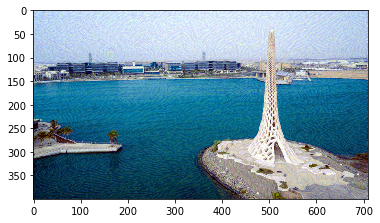

Total loss:  49513431040.0
Weighted Content loss:  8.377175331115723
Weighted Style loss:  49513429403.30505
Time [s]:  30.04203152656555


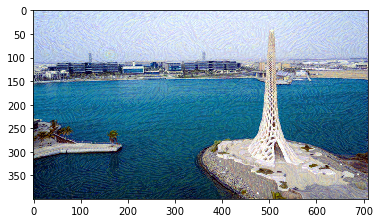

Total loss:  29191444480.0
Weighted Content loss:  8.632930755615234
Weighted Style loss:  29191443696.61808
Time [s]:  45.214083671569824


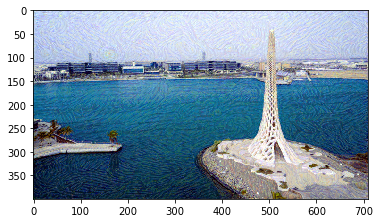

Total loss:  18842959872.0
Weighted Content loss:  8.805360794067383
Weighted Style loss:  18842959776.52073
Time [s]:  60.44340133666992


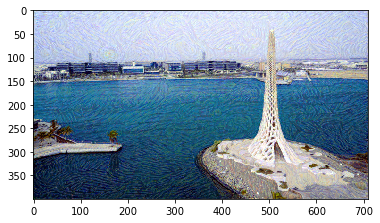

Total Time [s]:  60.66188049316406


In [15]:
# TODO Task 4: Style Transfer for content[0] and style[0] stored in target[0]
[s_0, slc_0] = run_model(vgg, layers_vgg, target[0], content_features_vgg[0], style_grams_vgg[0], 'conv4_2', style_weights_vgg, content_weight = 1, style_weight = 1.0e12, steps = 2000, lr = 0.003)

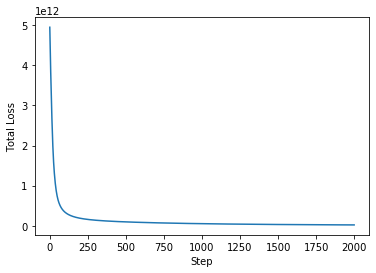

In [16]:
plt.plot(slc_0)
plt.xlabel('Step')
plt.ylabel('Total Loss')
plt.show()

(5000,)
Total loss:  33471993856.0
Weighted Content loss:  7.417128086090088
Weighted Style loss:  33471994102.00119
Time [s]:  12.674705028533936


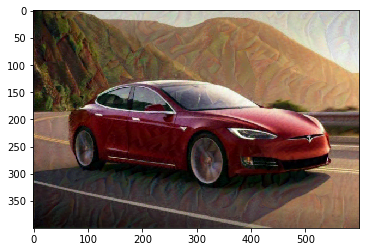

Total loss:  19532765184.0
Weighted Content loss:  7.87877082824707
Weighted Style loss:  19532764330.506325
Time [s]:  25.657018661499023


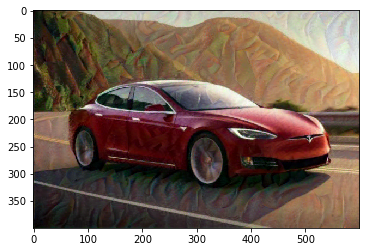

Total loss:  14253672448.0
Weighted Content loss:  8.098044395446777
Weighted Style loss:  14253672212.36229
Time [s]:  38.582759857177734


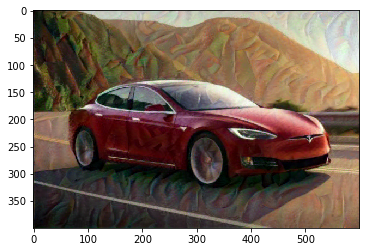

Total loss:  11379481600.0
Weighted Content loss:  8.252944946289062
Weighted Style loss:  11379481293.261051
Time [s]:  51.50347447395325


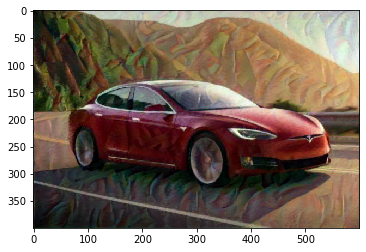

Total loss:  9524545536.0
Weighted Content loss:  8.372247695922852
Weighted Style loss:  9524545632.302761
Time [s]:  64.42610669136047


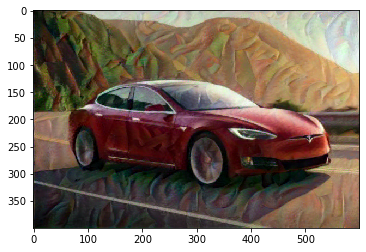

Total loss:  8197652992.0
Weighted Content loss:  8.466385841369629
Weighted Style loss:  8197653107.345104
Time [s]:  77.34292221069336


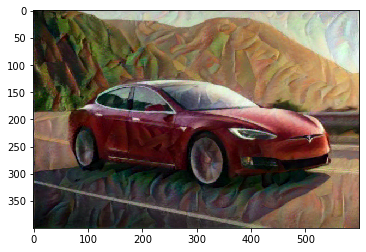

Total loss:  7213491712.0
Weighted Content loss:  8.543723106384277
Weighted Style loss:  7213491946.458817
Time [s]:  90.28636980056763


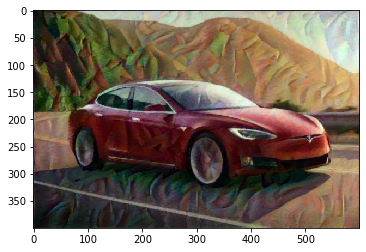

Total loss:  6459316736.0
Weighted Content loss:  8.618488311767578
Weighted Style loss:  6459316704.4222355
Time [s]:  103.22324752807617


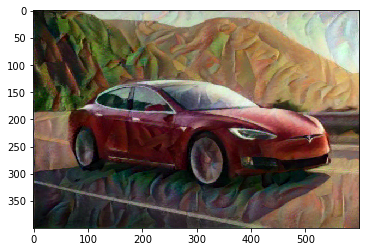

Total loss:  5892480000.0
Weighted Content loss:  8.662115097045898
Weighted Style loss:  5892479792.237282
Time [s]:  116.27392411231995


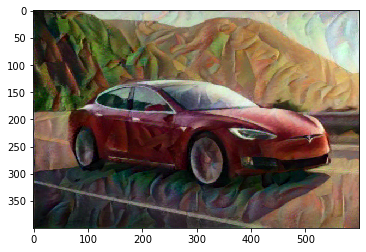

Total loss:  5460397568.0
Weighted Content loss:  8.702927589416504
Weighted Style loss:  5460397806.018591
Time [s]:  129.21787929534912


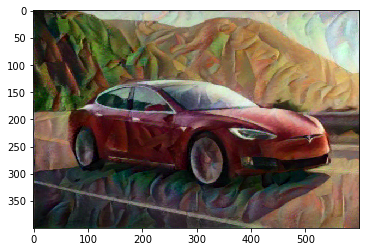

Total Time [s]:  129.42949032783508


In [17]:
# TODO Task 4: Style Transfer for content[1] and style[1] stored in target[1]
[s_1, slc_1] = run_model(vgg, layers_vgg, target[1], content_features_vgg[1], style_grams_vgg[1], 'conv4_2', style_weights_vgg, content_weight = 1, style_weight = 1.0e12, steps = 5000, lr = 0.003)

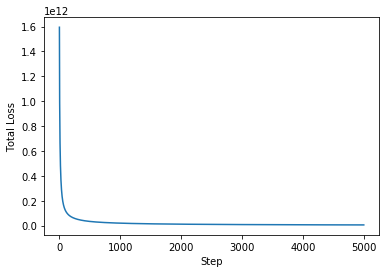

In [18]:
plt.plot(slc_1)
plt.xlabel('Step')
plt.ylabel('Total Loss')
plt.show()

(5000,)
Total loss:  43627077632.0
Weighted Content loss:  8.138814926147461
Weighted Style loss:  43627079576.25389
Time [s]:  10.861429214477539


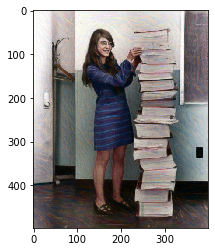

Total loss:  24379805696.0
Weighted Content loss:  8.613286972045898
Weighted Style loss:  24379806593.060493
Time [s]:  21.979453563690186


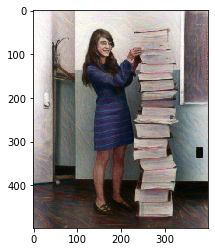

Total loss:  16851702784.0
Weighted Content loss:  8.834521293640137
Weighted Style loss:  16851702705.025673
Time [s]:  33.0140335559845


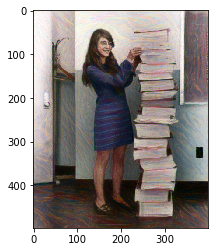

Total loss:  12759862272.0
Weighted Content loss:  8.98771858215332
Weighted Style loss:  12759862467.646599
Time [s]:  44.050633907318115


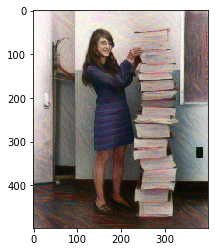

Total loss:  10153440256.0
Weighted Content loss:  9.113457679748535
Weighted Style loss:  10153440758.58593
Time [s]:  55.069974184036255


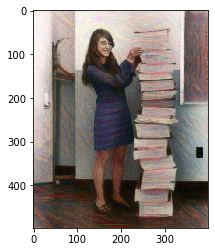

Total loss:  8349764096.0
Weighted Content loss:  9.212410926818848
Weighted Style loss:  8349764160.811901
Time [s]:  66.09482669830322


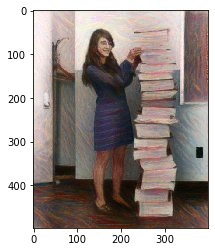

Total loss:  7043321856.0
Weighted Content loss:  9.280457496643066
Weighted Style loss:  7043322082.608938
Time [s]:  77.11784148216248


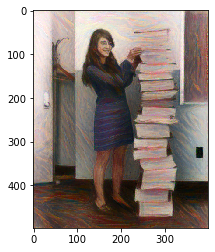

Total loss:  6065435648.0
Weighted Content loss:  9.335445404052734
Weighted Style loss:  6065435707.569122
Time [s]:  88.14311337471008


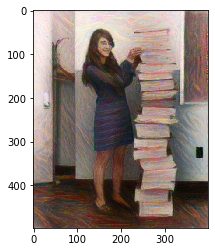

Total loss:  5328182784.0
Weighted Content loss:  9.391115188598633
Weighted Style loss:  5328182596.7133045
Time [s]:  99.18831014633179


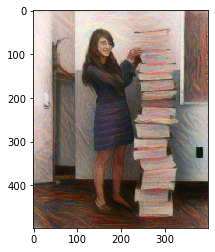

Total loss:  4737584128.0
Weighted Content loss:  9.42754077911377
Weighted Style loss:  4737584386.020899
Time [s]:  110.21113419532776


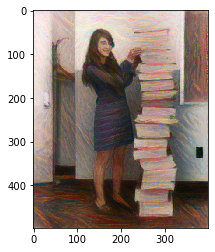

Total Time [s]:  110.45542645454407


In [19]:
# TODO Task 4: Style Transfer for content[2] and style[2] stored in target[2]
[s_2, slc_2] = run_model(vgg, layers_vgg, target[2], content_features_vgg[2], style_grams_vgg[2], 'conv4_2', style_weights_vgg, content_weight = 1, style_weight = 1.0e12, steps = 5000, lr = 0.003)

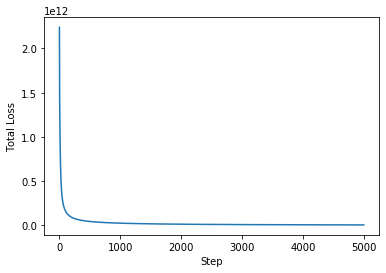

In [20]:
plt.plot(slc_2)
plt.xlabel('Step')
plt.ylabel('Total Loss')
plt.show()

(5000,)
Total loss:  5681669734400.0
Weighted Content loss:  27.033376693725586
Weighted Style loss:  5681669712066.65
Time [s]:  12.003075122833252


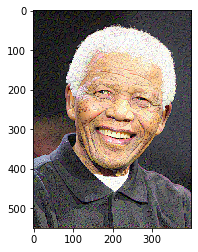

Total loss:  2633752117248.0
Weighted Content loss:  28.29035186767578
Weighted Style loss:  2633752107620.2393
Time [s]:  24.1759774684906


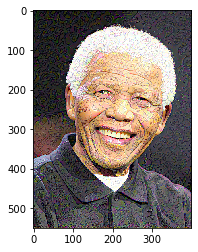

Total loss:  1657381584896.0
Weighted Content loss:  28.97783660888672
Weighted Style loss:  1657381653785.7056
Time [s]:  36.43816089630127


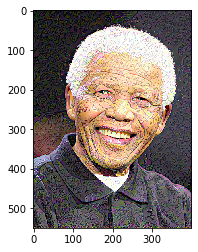

Total loss:  1169953652736.0
Weighted Content loss:  29.449630737304688
Weighted Style loss:  1169953703880.31
Time [s]:  48.630298137664795


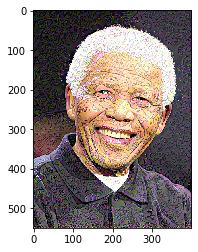

Total loss:  881314037760.0
Weighted Content loss:  29.8007755279541
Weighted Style loss:  881314039230.3467
Time [s]:  60.79931926727295


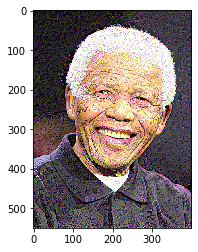

Total loss:  693795880960.0
Weighted Content loss:  30.063505172729492
Weighted Style loss:  693795859813.6902
Time [s]:  72.97934699058533


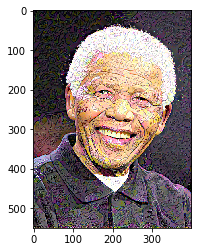

Total loss:  562476089344.0
Weighted Content loss:  30.260446548461914
Weighted Style loss:  562476098537.4451
Time [s]:  85.15818166732788


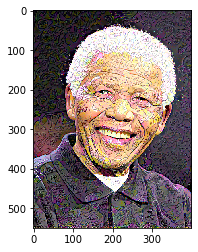

Total loss:  465131962368.0
Weighted Content loss:  30.43332290649414
Weighted Style loss:  465131968259.8114
Time [s]:  97.3331024646759


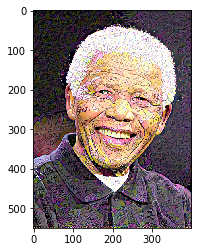

Total loss:  389936578560.0
Weighted Content loss:  30.5830135345459
Weighted Style loss:  389936596155.1666
Time [s]:  109.51572179794312


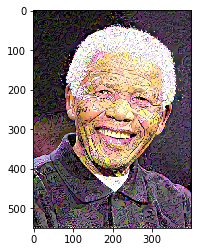

Total loss:  331238375424.0
Weighted Content loss:  30.728731155395508
Weighted Style loss:  331238389015.19775
Time [s]:  121.70003819465637


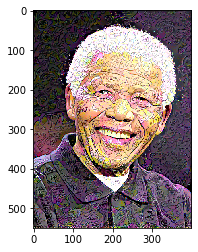

Total Time [s]:  121.86070227622986


In [21]:
# TODO Task 4: Style Transfer for content[3] and style[3] stored in target[3]
[s_3, slc_3] = run_model(vgg, layers_vgg, target[3], content_features_vgg[3], style_grams_vgg[3], 'conv4_2', style_weights_vgg, content_weight = 1, style_weight = 1.0e12, steps = 5000, lr = 0.003)

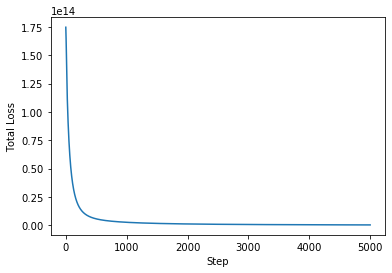

In [22]:
plt.plot(slc_3)
plt.xlabel('Step')
plt.ylabel('Total Loss')
plt.show()

In [22]:
def result_to_hd(image, filePath):
    image = im_convert(image)

    formatted = (image * 255 / np.max(image)).astype('uint8')
    pil_image = Image.fromarray(formatted, 'RGB')
    pil_image.save(filePath, "JPEG")

In [24]:
# Save results to hard disc
result_to_hd(s_0, "s0.jpg")
result_to_hd(s_1, "s1.jpg")
result_to_hd(s_2, "s2.jpg")
result_to_hd(s_3, "s3.jpg")

save_files = ['s0', 's1', 's2', 's3']

# load in content and style images
target_img = [load_image(c + '.jpg').to(device) for c in save_files]

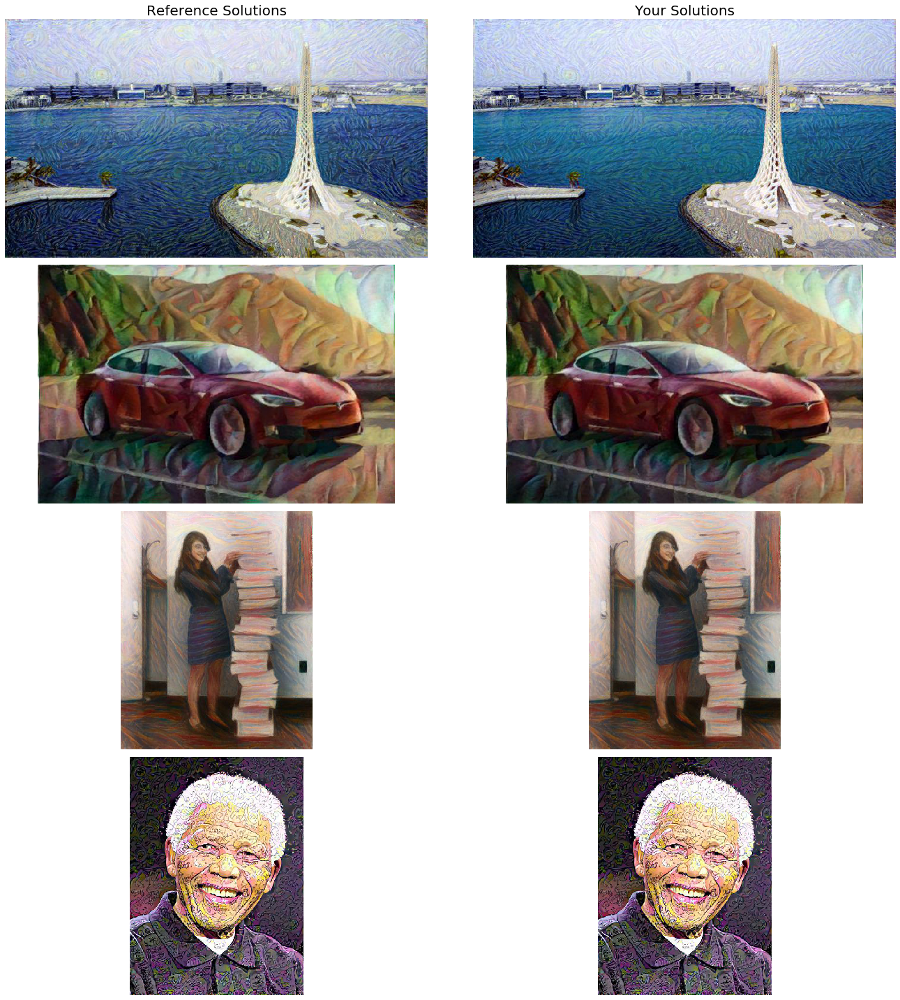

In [25]:
# Comparison to Reference Solution - Do not change anything, just execute to varify correctness of your solution

fig, axs = plt.subplots(num_pairs, 2, figsize=(20, 20))

axs[0, 0].set_title('Reference Solutions', fontsize=20)
axs[0, 1].set_title('Your Solutions', fontsize=20)

# content and correspoinding style image side-by-side
for row in range(0, num_pairs):
        axs[row, 0].imshow(im_convert(ref_vgg[row]))
        axs[row, 1].imshow(im_convert(target_img[row]))

        for col in range(0, 2):
            axs[row, col].axis('off')
        
fig.tight_layout()
plt.show()

In [15]:

save_files = ['s0', 's1', 's2', 's3']
target_img = [load_image(c + '.jpg').to(device) for c in save_files]

target_ref_loss = 0
for row in range(0, num_pairs):
        loss = torch.mean((ref_vgg[row] -target_img[row]) ** 2)
        target_ref_loss += loss
target_ref_loss

tensor(0.1399, device='cuda:0')

## Please refer to run_array.sh and project_style-transfer_task1_4.py for coding details
I choose the least content loss parameters

In [16]:
import itertools
#STYLE_WEIGHTS = [1e3,1e6,1e9,1e12]
#STEPS = [500,1000,2000]
#LRS = [0.1,0.01,0.001]
STYLE_WEIGHTS = [1e2,1e4,1e6,1e8,1e10,1e12,1e14]
STEPS = [2000,3000,4000,5000,6000]
LRS = [0.1,0.01,0.007,0.005,0.003,0.001,0.0005]
Res = list(itertools.product(STYLE_WEIGHTS, STEPS, LRS))
Target_ref_loss = np.zeros(len(Res))
for i in range(len(Res)):
    STYLE_WEIGHT,STEP,LR = Res[i]
    for row in range(0, num_pairs):
        target_image = load_image("target_images/s%d_%.0f_%d_%.1g.jpg"%(row,STYLE_WEIGHT,STEP,LR)).to(device)
        loss = torch.mean((ref_vgg[row] -target_image) ** 2)
        Target_ref_loss[i] += loss
    if(STYLE_WEIGHT == 1e12 and STEP==2000 and LR == 0.003):
        print(Target_ref_loss[i])

0.24459072947502136


## The best results is style_weights = 1e12, steps = 5000, lr = 0.003

In [17]:
print(np.min(Target_ref_loss))
STYLE_WEIGHT,STEP,LR = Res[np.argmin(Target_ref_loss)]
print(STYLE_WEIGHT,STEP,LR)

0.11396723985671997
1000000000000.0 5000 0.003


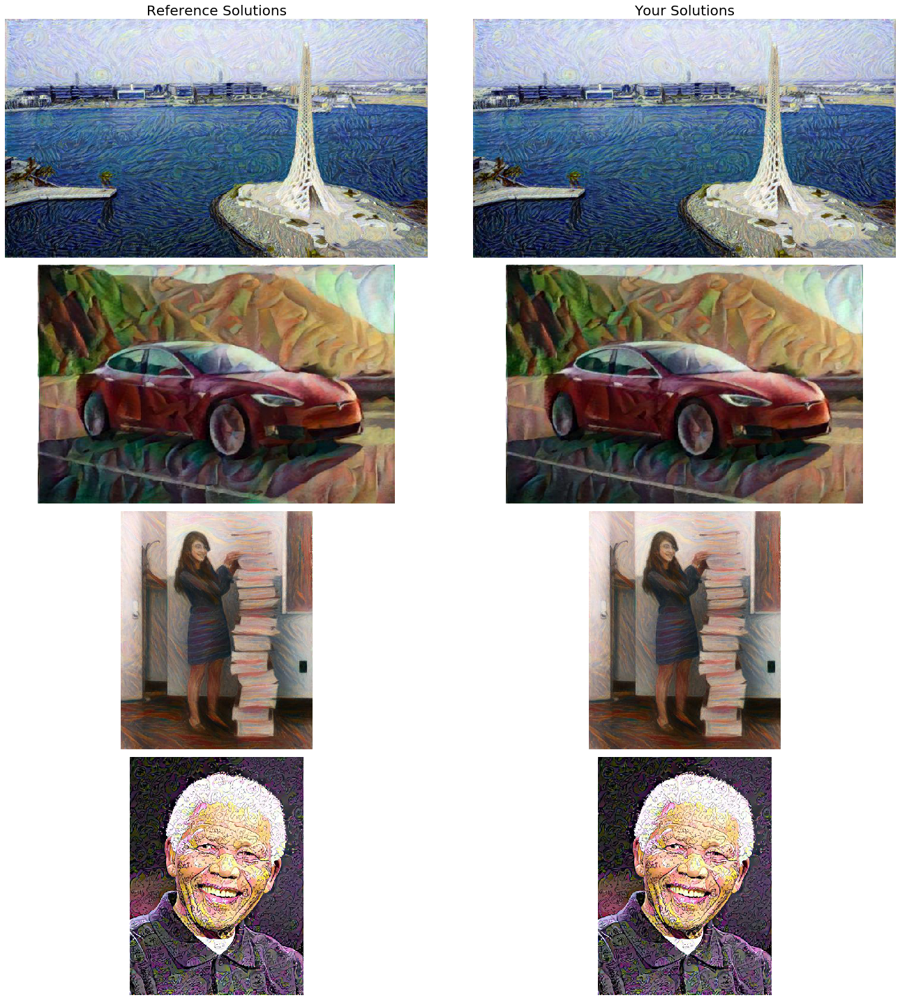

In [18]:
# Comparison to Reference Solution - Do not change anything, just execute to varify correctness of your solution

fig, axs = plt.subplots(num_pairs, 2, figsize=(20, 20))

axs[0, 0].set_title('Reference Solutions', fontsize=20)
axs[0, 1].set_title('Your Solutions', fontsize=20)

# content and correspoinding style image side-by-side
for row in range(0, num_pairs):
        target_img = load_image("target_images/s%d_%.0f_%d_%.1g.jpg"%(row,STYLE_WEIGHT,STEP,LR)).to(device)
        axs[row, 0].imshow(im_convert(ref_vgg[row]))
        axs[row, 1].imshow(im_convert(target_img))

        for col in range(0, 2):
            axs[row, col].axis('off')
        
fig.tight_layout()
plt.show()

# Perceptual Losses for Real-Time Style Transfer and Super-Resolution [5]

Instead of solving an optimization problem for each target image, Johnson et al. [5] train a feed forward neural network for style transfer. Your task now is to re-implement certain aspects of their method.

In [8]:
# Helper Functions and classes, you do not have to change anything here, you can however if these functions do not fully satisfy your needs

class ImageDataset(Dataset):
    def __init__(self, root):
        self.root = root
        self.total_imgs = os.listdir(root)

    def __len__(self):
        return len(self.total_imgs)

    def __getitem__(self, idx):
        return load_image(os.path.join(self.root, self.total_imgs[idx]))[0]
    
def get_checkpoint_dir(suffix = None):
    max_num = 0

    dirs = [os.path.basename(x[0]) for x in os.walk('checkpoints')]

    for dir in dirs:
        elems = dir.split('_')
        if len(elems) > 0:
            prefix = elems[0]

            if len(prefix) > 0 and all(map(str.isdigit, prefix)):
                num = int(prefix)

                if max_num <= num:
                    max_num = num + 1

    checkpoint_dir = os.path.join('checkpoints', str(max_num).zfill(5) + '_checkpoint_' + (suffix if not suffix == None else ''))

    return max_num, checkpoint_dir

def write_checkpoint(checkpoint_dir, model, optimizer, iter_number):
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)

    torch.save({
        'state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        }, os.path.join(checkpoint_dir, str(iter_number).zfill(6) + '.pth'))

def load_checkpoint(pth_path, model, optimizer = None):
    checkpoint = torch.load(pth_path)

    model.load_state_dict(checkpoint['state_dict'])

    if not optimizer is None:
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

def asMinutes(s):
    m = math.floor(s / 60)
    s -= m * 60
    return '%dm %ds' % (m, s)

def timeSince(since, percent):
    now = time.time()
    s = now - since
    es = s / (percent)
    rs = es - s
    return '%s (- %s)' % (asMinutes(s), asMinutes(rs))

## Task 5.1: Implement the Residual Block (5 points)

The authors of [5] explain the details about the proposed neural network in [6]. Start with implementing the residual block.

In [9]:
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        
        # TODO Task 5.1
        self.conv1 = ConvolutionalBlock(channels, channels, kernel_size=3, stride=1)
        self.relu = torch.nn.ReLU()
        self.conv2 = ConvolutionalBlock(channels, channels, kernel_size=3, stride=1)
    
    def forward(self, x):
        
        # TODO Task 5.1
        residual = x
        out = self.relu(self.conv1(x))
        out = self.conv2(out)
        out = out + residual

        return out

## Task 5.2: Implement the Convolutional Block (5 points)

Refer to [5] and [6] for details. Note that the convolutional block shown in [6] in Figure 1 is only for explanatory reasons. Here the goal is to implement a convolutional block consisting of one convolutional layer, batch normalization and activation layer. However, feel free to adapt the structure, e.g. also to implement a convolutional block consisting of two conv layers.

In [10]:
class ConvolutionalBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, norm="batchNorm"):
        super(ConvolutionalBlock, self).__init__()
        
        # TODO Task 5.2
        reflection_padding = kernel_size // 2
        self.reflection_pad = torch.nn.ReflectionPad2d(reflection_padding)
        self.conv2d = torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride)
        self.batchNorm = torch.nn.BatchNorm2d(out_channels, affine=True)
        self.norm = norm
		#self.relu = nn.ReLU()

    def forward(self, x):
        
        # TODO Task 5.2
        x = self.reflection_pad(x)
        x = self.conv2d(x)
        
        if (self.norm=="None"):
            x = x
        else:
            x = self.batchNorm(x)
        return x

## Task 5.3: Implement the Deconvolutional Block (5 points)

In [6], the authors refer to the deconvolution as a convolution with a stride of 1/2. In PyTorch, this is achieved using a `nn.ConvTranspose2d`  layer. Be careful when setting values for `padding` and `output_padding`, such that the output size matches the size explained in [6].

In [11]:
class DeconvolutionalBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride, output_padding):
        super(DeconvolutionalBlock, self).__init__()
        
        # TODO Task 5.3
       
        padding_size = kernel_size // 2
        self.conv_transpose = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding_size, output_padding)
        self.batchNorm = nn.BatchNorm2d(out_channels, affine=True)


    def forward(self, x):
        
        # TODO Task 5.3
        x = self.conv_transpose(x)
        x = self.batchNorm(x)

        return x

## Task 6: Put it all together (5 points)

Using the blocks from Tasks 5.1 to 5.3, assemble a neural network structure for style transfer (so not the one for super resolution) as explained in [5] and [6].

In [12]:
class StyleTransferNetwork(nn.Module):
    def __init__(self):
        super(StyleTransferNetwork, self).__init__()
        
        # TODO Task 5.4
        # Initial convolution layers
        self.ConvBlock = nn.Sequential(
            ConvolutionalBlock(3, 32, 9, 1),
            nn.ReLU(),
            ConvolutionalBlock(32, 64, 3, 2),
            nn.ReLU(),
            ConvolutionalBlock(64, 128, 3, 2),
            nn.ReLU()
        )
        # Residual layers
        self.ResBlock = nn.Sequential(
            ResidualBlock(128), 
            ResidualBlock(128), 
            ResidualBlock(128), 
            ResidualBlock(128), 
            ResidualBlock(128)
        )
        
        # Deconvolutional Layers 
        self.DeconvBlock = nn.Sequential(
            DeconvolutionalBlock(128, 64, 3, 2, 1),
            nn.ReLU(),
            DeconvolutionalBlock(64, 32, 3, 2, 1),
            nn.ReLU(),
            ConvolutionalBlock(32, 3, 9, 1, norm="None")
        )
        
    def forward(self, x):
        
        # TODO Task 5.4
        x = self.ConvBlock(x)
        x = self.ResBlock(x)
        x = self.DeconvBlock(x)
        
        return x


## Training

In [17]:
# Hyperparameters
learning_rate = 1
decay_learning_rate = 0.01
decay_learning_rate_at = 10000
batch_size = 4
num_epochs = 2

content_weight = 20
style_weight = 10
tv_weight = 1e-4

plot_every = 500 # 1000
checkpoint_every = 500# 5000

content_img_name = 'chicago'
content_img_path = os.path.join('img', 'content', content_img_name + '.jpg')
content_torch = load_image(content_img_path).to(device)


In [14]:
# TODO: Choose a style that you like and that you would like to train your model on by setting style_idx appropriately

style_names = ['candy', 'composition_vii', 'feathers', 'la_muse', 'mosaic', 'starry_night_crop', 'the_scream' 'udnie', 'wave_crop']
style_idx = 4

print('Chosen Style:', style_names[style_idx])

Chosen Style: mosaic


Similiar to the authors of [5], we want to use vgg16 this time.

In [15]:
# Load VGG 16
# get the "features" portion of VGG16 (we will not need the "classifier" portion)
vgg16 = models.vgg16(pretrained = True).features.to(device)

In [57]:
print(vgg16)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

## Task 6.1 Complete the training method, refer to [5] and [6] for details (10 points)

In [18]:
def train_model(style_name,learning_rate):

    coco_dir = 'MSCOCO_256x256'

    train_dataset = ImageDataset(root = os.path.join(coco_dir, 'train2014'))

    train_loader = torch.utils.data.DataLoader(
        train_dataset,
        batch_size = 4,
        num_workers = 0,
        shuffle = True
    )

    model = StyleTransferNetwork().to(device)
    #if(torch.cuda.device_count() > 1):
    #    print("Let's use", torch.cuda.device_count(), "GPUs")
    #   model = nn.DataParallel(model)
    #model.to(device)

    optimizer = optim.Adam(model.parameters(), lr = learning_rate)
    #pth_path = os.path.join('checkpoints', '00000_checkpoint_mosaic_content_weight_5.0_style_weight_100.0_tv_weight_1e-06', '004000.pth')
    #load_checkpoint(pth_path, model)


    learning_curve = []

    # freeze all VGG parameters since we're only optimizing the target image
    for param in vgg16.parameters():
        param.requires_grad_(False)
        
    # TODO Task 6.1: Similar as it was done before, find the correspondence of all image numbers and image names in vgg16 that are used in [5] for style transfer. You can again use the print(vgg16) command.
    layers_vgg = {'3':'relu1_2',
                  '8':'relu2_2',
                  '15':'relu3_3',
                  '22':'relu4_3'}


    style_image_path = os.path.join('img', 'style', style_name + '.jpg')
    style_image = load_image(style_image_path).to(device)


    B, C, H, W = style_image.shape
    style_image = style_image.expand(4, C, H, W)

    style_features = get_features(style_image, vgg16, layers_vgg)
    style_grams = {layer: gram_matrix(style_features[layer], normalize = True) for layer in style_features}

    
    # TODO Task 6.1: Find the name of the content layer in vgg16 that is used in [5] for style transfer
    content_layer = 'relu3_3'

    # TODO Task 6.1: Find the names of the style layers in vgg16 that is used in [5] for style transfer and create a dictionary with entries 'name': 1.0
    style_weights = {'relu1_2': 1.0,
                     'relu2_2':0.5,
                     'relu3_3':0.2,
                     'relu4_3':0.1}

    num_batches = len(train_loader)
    num_iters = num_epochs * num_batches

    num_iter = 0

    weight_string = '_content_weight_{}_style_weight_{}_tv_weight_{}'.format(content_weight, style_weight, tv_weight)
    run_id, checkpoint_dir = get_checkpoint_dir(style_names[style_idx] + weight_string)
    
    #print("Writing checkpoints to", checkpoint_dir)

    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)

    running_loss = 0

    start = time.time()

    model.train()

    for epoch in range(num_epochs):

        for batch_idx, images in enumerate(train_loader):
			# Free-up unneeded cuda memory
            #gc.collect()
            #torch.cuda.empty_cache()

            b, c, h, w = images.shape

            images = images.to(device)
            #print(images)
            
            # TODO Task 6.1: Get the features for the current batch of images
            #content_features = None    ###Do not used [] outside for style_features
            content_features = get_features(images, vgg16, layers_vgg)
            
            # TODO Task 6.1: Send the batch of images through the network
            #out = vgg16(images)
            out = images.clone().to(device)
            out = model(out)
            #print(out)

            # TODO Task 6.1: Get the features for the model output
            #target_features = get_features(images, vgg16,layers_vgg)
            target_features = get_features(out.clone().requires_grad_(True).to(device), vgg16,layers_vgg)
        
            target_grams = {layer: gram_matrix(target_features[layer], normalize=True) for layer in target_features}

            # Content Loss (Feature Loss)
            content_loss = torch.mean((target_features[content_layer] - content_features[content_layer]) ** 2)

            # Style Loss
            style_loss = 0

            # then add to it for each layer's gram matrix loss
            for layer in style_weights:
                _,c,h,w = target_features[layer].shape
                target_gram = target_grams[layer]
                style_gram = style_grams[layer]
                layer_style_loss=style_weights[layer]*(torch.sum((target_gram - style_gram) ** 2)/b)
                style_loss += layer_style_loss
                
            ## TODO Task 6.1: Compute the anisotropic Total Variation loss of out according to https://en.wikipedia.org/wiki/Total_variation_denoising
            tv_loss = torch.sum(torch.abs(out[:, :, :, :-1] - out[:, :, :, 1:]))+ torch.sum(torch.abs(out[:, :, :-1, :] - out[:, :, 1:, :]))
            tv_loss =  tv_loss / b


            # TODO Task 6.1: Compute the total weighted loss consisting of content loss, style loss and total variation loss
            total_loss =  content_weight * content_loss + style_weight * style_loss + tv_weight * tv_loss
            optimizer.zero_grad()
            total_loss.backward()

            #running_loss += total_loss
            running_loss += total_loss.item()
			
            if num_iter  % decay_learning_rate_at == 0:
                #learning_rate = decay_learning_rate
                learning_rate = learning_rate/2
                optimizer = optim.Adam(model.parameters(), lr = learning_rate)
            # update weights
            #total_loss.backward()
            optimizer.step()

            num_iter += 1

            if num_iter % plot_every == 0:
                model.eval()
                print('style loss %.2f, content loss %.2f tv loss %.2f'%(style_loss,content_loss,tv_loss))
                print('%s (%d %d%%) %.4f' % (timeSince(start, num_iter / num_iters),num_iter, num_iter / num_iters * 100, running_loss / plot_every))
                
                learning_curve.append(running_loss / plot_every)

                # Send current state image to Tensorboard
                #out = model(content_torch)

                #plt.imshow(im_convert(out))
                #plt.show()

                running_loss = 0

                model.train()

            if num_iter % checkpoint_every == 0:
                # Write Checkpoint
                print("Writing checkpoints to", checkpoint_dir)
                write_checkpoint(checkpoint_dir, model, optimizer, num_iter)
                
    return model, np.asarray(learning_curve)


## Train the model
## Train on command line env with script run_task5_6.sh  and project_style-transfer_task5_6.2.py

In [21]:
# TODO: Train the model
model, learning_curvce = train_model(style_names[style_idx])

1m 17s (- 51m 59s) (1000 2%) 748.2557
Writing checkpoints to checkpoints/00012_checkpoint_mosaic_content_weight_5.0_style_weight_100.0_tv_weight_1e-06
2m 34s (- 50m 48s) (2000 4%) 748.6340
Writing checkpoints to checkpoints/00012_checkpoint_mosaic_content_weight_5.0_style_weight_100.0_tv_weight_1e-06
3m 52s (- 49m 36s) (3000 7%) 748.4108
Writing checkpoints to checkpoints/00012_checkpoint_mosaic_content_weight_5.0_style_weight_100.0_tv_weight_1e-06
5m 10s (- 48m 18s) (4000 9%) 749.7643
Writing checkpoints to checkpoints/00012_checkpoint_mosaic_content_weight_5.0_style_weight_100.0_tv_weight_1e-06


RuntimeError: CUDA out of memory. Tried to allocate 64.00 MiB (GPU 0; 31.75 GiB total capacity; 27.35 GiB already allocated; 47.75 MiB free; 3.31 GiB cached)

## Inference

Test the final model on the given content image, showing the skyline of Chicago.

In [43]:
# TODO: Adapt the path so that it points to your model
pth_path = os.path.join('checkpoints', '00021_checkpoint_mosaic_content_weight_20_style_weight_10_tv_weight_0.0001', '020400.pth')
model = StyleTransferNetwork().to(device)
#pth_path
load_checkpoint(pth_path, model)


output_path = "output"
content_torch = load_image(content_img_path).to(device)
out = model(content_torch)
result_to_hd(out[0], os.path.join(output_path, content_img_name + '_' + style_names[style_idx] + '.jpg'))

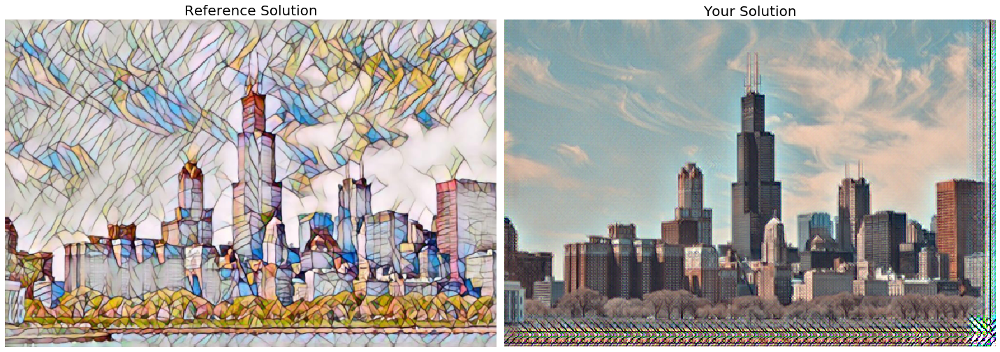

In [44]:
# Comparison to Reference Solution - Do not change anything, just execute to varify correctness of your solution

content_torch = load_image(content_img_path).to(device)

ref_output_path = os.path.join('img', 'ref', content_img_name + '_' + style_names[style_idx]  + '.jpg')
ref_output_torch = load_image(ref_output_path).to(device)

fig, axs = plt.subplots(1, 2, figsize=(20, 20))

axs[0].set_title('Reference Solution', fontsize=20)
axs[1].set_title('Your Solution', fontsize=20)

# content and correspoinding style image side-by-side
axs[0].imshow(im_convert(ref_output_torch))
axs[1].imshow(im_convert(out))

for col in range(0, 2):
    axs[col].axis('off')
        
fig.tight_layout()
plt.show()

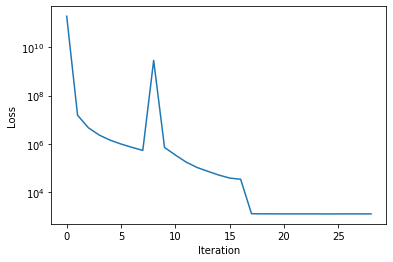

In [38]:
learning_curve = np.load('learning_curve.checkpoint.npy')
plt.plot(learning_curve)
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.yscale('log')
#plt.ylim(0,1e7)
plt.show()

In [35]:
learning_curve

array([1.90790459e+11, 1.53784303e+07, 4.63933870e+06, 2.31865870e+06,
       1.43248122e+06, 9.89552440e+05, 7.23258879e+05, 5.39312316e+05,
       2.84985248e+09, 7.14508531e+05, 3.47471278e+05, 1.76226575e+05,
       1.06004090e+05, 7.33250499e+04, 5.15628706e+04, 3.87644809e+04,
       3.47153701e+04, 1.30769743e+03])

# Deep Correlations for Texture synthesis [2]

The paper [2] presents a texture synthesis technique that builds upon convolutional neural networks and extracted statistics of pre-trained deep features. The main contribution is the introduction of *deep correlation matrices* that allow the synthesis of textures that not only resemble local but also global structure of an example image.

## Task 7: VGG Layer Replacement (5 points)

The authors of [2] suggest to replace all MaxPool layers with Averaging layers for better results. This should be done in the cell below.

In [49]:
# Replace MaxPool Layers in VGG19 network with average pooling layers

# TODO Task 7: Identify maxpool layer indices
maxpool_idx = [4, 9, 18, 27, 36]

for i in maxpool_idx:
    # TODO Task 7: Replace maxpool layer with averaging layer
    vgg[i] = nn.AvgPool2d(kernel_size = 2, stride=2)

In [50]:
# Define the layers from which the features are extracted

layers_deepcorr = {'0': 'conv1',
                   '4': 'pool1',
                   '9': 'pool2', 
                  '18': 'pool3', 
                  '27': 'pool4'}  ## content representation

## Task 8: Implement the computation of the deep correlation matrices $R^{l,n}_{i,j}$ for a given tensor representing layer $l$ as decribed in [2] (10 points)

Note that the computation of $R^{l,n}_{i,j}$ requires a convolution (or more correctly, a cross-correlation) of each feature map with itself. Instead of trying to implement this convolution using nested `for` loops, use the `nn.Conv2d` module for performance reasons. Do not forget to use appropriate zero-padding that allows an output size equal to `output_size` and to set `bias=False`. Further do not forget to compute appropriate weights $w_{i,j}$.

In [51]:
def deep_corr_matrix_stack(tensor, output_size = None):
    """ Calculate the set of Deep Correlation Matrices for a given tensor as described in [2]
    """
    
    # TODO Task 8: implement the computation of the deep correlation matrices
    
    _, depth, height, width = tensor.shape
    wi_1 = torch.FloatTensor.abs_(torch.arange(-height,-height//2+1, dtype=torch.float))
    wi_2 = torch.arange(height//2,height, dtype=torch.float)
    wi = torch.cat((wi_2, wi_1), 0)
    wj_1 = torch.FloatTensor.abs_(torch.arange(-width,-width//2+1, dtype=torch.float))
    wj_2 = torch.arange(width//2,width, dtype=torch.float)
    wj = torch.cat((wj_2, wj_1), 0)
    wi = wi.reshape(len(wi),1)
    wj = wj.reshape(1,len(wj))
    w = 1/torch.mm(wi,wj)     ###height+1, width+1
    
    # cx: tensor should be a set of feature maps
    deep_corr = w.to(device) * F.conv2d(tensor, tensor.reshape(depth,1,height,width), padding=(width//2,height//2), groups=depth).to(device)
    
    return deep_corr

In [62]:
a = deep_corr_matrix_stack(torch.randn(1,4,4,4), output_size = None)
print(a.shape)

torch.Size([1, 4, 5, 5])


## Task 9: Implement the computation of the smoothness loss $E^l_{smooth}$ for a given tensor representing layer $l$ as decribed in [2] (10 points)

Note that Equation 10 defining $E^l_{smooth}$ in the paper [2] is missing an important factor for the sum of exponentials. Please refer to Appendix B for the correct version that directly reflects the equation as it was also implemented by the authors. Further note that the equation implicitly requires each pixel to have exactly 4 neighbors in its 4-connected neighborhood. We therefore have two options to handle boarder pixels:

* If we access an index beyond the image limits, we access the pixel on the opposite image boarder (`circ = True`).
* The pixel values of non-existing neighbors beyond the image limits are assumed to have value 0 (`circ = False`).

You can experiment with both versions, but you only have to implement one to get full points.

In [66]:
def E_smooth(tensor, sigma = 0.001, circ = True):
    
    # get the batch_size, depth, height, and width of the Tensor
    _, d, Q, M = tensor.size()
    
    # TODO Task 8: Implement the computation of E^l_{smooth}

    e_smooth = None
    _, depth, height, width = tensor.size()
    log_d = 0
    neighbors_right = tensor[: ,: ,: , 1:].clone() 
    neighbors_left = tensor[: ,: ,: , :-1].clone() 
    neighbors_up = tensor[: ,: , : -1, :].clone() 
    neighbors_down = tensor[: ,: , 1: , :].clone() 
    if circ:
        neighbors_right = torch.cat((neighbors_right, tensor[: ,: ,: ,:1]), 3)
        neighbors_left = torch.cat((tensor[: ,: ,: ,-1:], neighbors_left), 3)
        neighbors_up = torch.cat((tensor[: ,: ,-1: ,:],neighbors_up), 2)
        neighbors_down = torch.cat((neighbors_down, tensor[: ,: ,:1 ,:]), 2)
      
    else:
        neighbors_right = F.pad(neighbors_right, pad=(0,1,0,0), mode='constant', value=0)
        neighbors_left = F.pad(neighbors_left, pad=(1,0,0,0), mode='constant', value=0)
        neighbors_up = F.pad(neighbors_up, pad=(0,0,1,0), mode='constant', value=0)
        neighbors_down = F.pad(neighbors_down, pad=(0,0,0,1), mode='constant', value=0)
    e = torch.exp(-torch.sigmoid((tensor - neighbors_right)**2)) + torch.exp(-torch.sigmoid((tensor - neighbors_left)**2)) + torch.exp(-torch.sigmoid((tensor - neighbors_up)**2)) + torch.exp(-torch.sigmoid((tensor - neighbors_down)**2))
    e_smooth = (1/(2*sigma))*torch.sum(torch.log((1/4)*e))

    return e_smooth

In [67]:
a = E_smooth(torch.randn(1,4,4,4))
print(a)

tensor(-23291.7520)


In [68]:
def white_gauss_noise(size, mu = 0, sigma = 1.0e-3):
    m = torch.distributions.normal.Normal(mu, sigma)
    return m.sample(size)

In [69]:
''' Define and load texture files '''

texture_files = ['Texture13', 'Texture25', 'Texture62', 'Texture115']
ref_tex_files = ['tex0_ref', 'tex1_ref', 'tex2_ref', 'tex3_ref']

# load in texture images
texture_size = 225
texture = [load_image('img/texture/' + t + '.png', texture_size).to(device) for t in texture_files]

ref_tex = [load_image('img/ref/' + t + '.jpg', texture_size).to(device) for t in ref_tex_files]

target = [white_gauss_noise((t.shape[0], t.shape[1], t.shape[2], t.shape[3]), mu = 0, sigma = 0.01).to(device).requires_grad_(True) for t in texture]

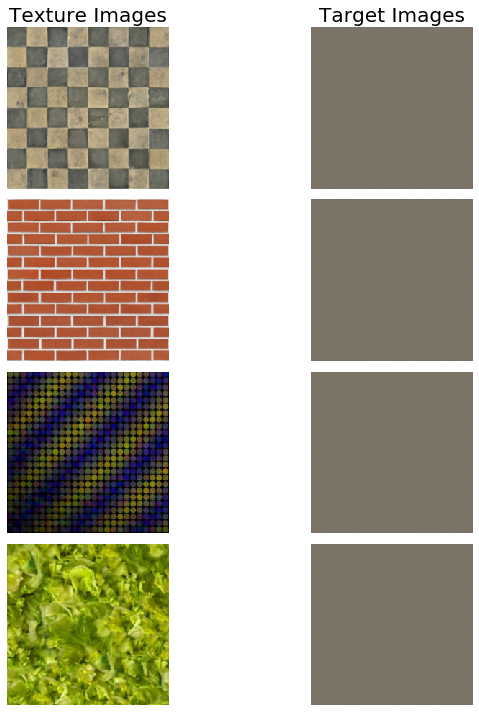

In [70]:
# display the images
num_textures = len(texture)
num_pairs=num_textures
fig, axs = plt.subplots(num_pairs, 2, figsize=(10, 10))

axs[0, 0].set_title('Texture Images', fontsize=20)
axs[0, 1].set_title('Target Images', fontsize=20)

# content and correspoinding style image side-by-side
for row in range(0, num_pairs):
        axs[row, 0].imshow(im_convert(texture[row]))
        axs[row, 1].imshow(im_convert(target[row]))

        for col in range(0, 2):
            axs[row, col].axis('off')
        
fig.tight_layout()
plt.show()

In [71]:
# weights and parameters (cf. Table 1 in the paper [2])

# alpha, beta, gamma and delta corresponding to the loss weights for E_Grm, E_DCor, E_Div and E_Smooth
alpha = 0.5
beta = 0.5
gamma = -1.0e-6
delta = -0.75e-6


gram_layer_weights = {'pool1': 0.25,
                      'pool2': 0.25,
                      'pool3': 0.25,
                      'pool4': 0.25}

dcor_layer_weights = {'pool2': 1}
div_layer_weights = {'pool2': 1}
smooth_layer_weights = {'conv1': 1}

sigma = 1.0e-3

In [72]:
# get texture features only once before training
texture_features = [get_features(t, vgg, layers_deepcorr) for t in texture]
#style_features = [get_features(s, vgg) for s in style]

# calculate gram matrices G
texture_grams = [{layer: gram_matrix(t[layer]) for layer in t if layer in gram_layer_weights} for t in texture_features]

# calculate deep correlation matrices R
texture_dcors = [{layer: deep_corr_matrix_stack(t[layer]) for layer in t if layer in dcor_layer_weights} for t in texture_features]

# pick features for E_Div
texture_divs = [{layer: t[layer] for layer in t if layer in div_layer_weights} for t in texture_features]

# pick features for E_Smooth
texture_smooths = [{layer: t[layer] for layer in t if layer in smooth_layer_weights} for t in texture_features]

## Task 10: Texture Synthesis Function (10 points - 4 examples, 2.5 points each)

Complete the texture synthesis function below. Note that we do not use the Adam optmizer this time but LBFGS.

In [66]:
def texture_synthesis_lbfgs(tex_idx, lr = 1):

    # for displaying the target image, intermittently
    save_every = 10
    print_every = 10
    
    def closure():

        # get the features from your target image
        target_features = get_features(target[tex_idx], vgg, layers_deepcorr)

        # E_Grm
        E_Grm = 0
        if alpha != 0:
            for layer in gram_layer_weights:
                target_feature = target_features[layer]
                _, d, Q, M = target_feature.size()
                
                # TODO Task 10: Compute E_l_Grm as defined in [2] and shown in Appendix B
                E_l_Grm = None
                target_gram = gram_matrix(target_feature)
                texture_gram = texture_grams[tex_idx][layer]
                E_l_Grm = gram_layer_weights[layer]*torch.sum(((target_gram-texture_gram)**2).view(-1)) / (2*d*Q*M)**2 
                
                E_Grm = E_Grm + E_l_Grm
                
        # E_DCor
        E_DCor = 0
        if beta != 0:
            for layer in dcor_layer_weights:
                target_feature = target_features[layer]
                _, d, Q, M = target_feature.size()

                # TODO Task 10: Compute E_l_Dcor as defined in [2] and shown in Appendix B
                E_l_Dcor = None
                target_dcor = deep_corr_matrix_stack(target_feature) 
                texture_dcor = texture_dcors[tex_idx][layer] 
                E_l_Dcor_difference = torch.sum(((target_dcor-texture_dcor)**2).view(-1))
                E_l_Dcor = dcor_layer_weights[layer] * E_l_Dcor_difference / 4
                

                E_DCor = E_DCor + E_l_Dcor
    
        # E_Div
        E_Div = 0
        if gamma != 0:
            for layer in div_layer_weights:
                target_feature = target_features[layer]
                _, d, Q, M = target_feature.size()
                
                # TODO Task 10: Compute E_l_Div as defined in [2] and shown in Appendix B
                E_l_Div = None
                target_div = target_feature.view(-1)
                texture_div = texture_divs[tex_idx][layer].view(-1)
                E_l_Div = div_layer_weights[layer]*torch.sum((target_div-texture_div)**2)/2

                E_Div = E_Div + E_l_Div

        # E_Smooth
        E_Smooth = 0
        if delta != 0:
            for layer in smooth_layer_weights:
                
                # TODO Task 10: Compute E_l_Smooth as defined in [2] and shown in Appendix B
                target_feature = target_features[layer]
                E_l_Smooth = smooth_layer_weights[layer] * E_smooth(target_feature)  

                E_Smooth = E_Smooth + E_l_Smooth

        # calculate the *total* loss
        
        # TODO Task 10: Compute the total loss as defined in [2] and shown in Appendix B
        total_loss = alpha * E_Grm + beta * E_DCor + gamma * E_Div + delta * E_Smooth

        # update your target image
        optimizer.zero_grad()
        total_loss.backward()
        # optimizer.step()
        return total_loss

    # iteration hyperparameters
    start = time.time()
    
    # Similar to the reference implementation by the authors of [2], we use LBFGS this time to optimize our texture
    
    # torch.optim.LBFGS(params, lr=1, max_iter=20, max_eval=None, tolerance_grad=1e-05, tolerance_change=1e-09, history_size=100, line_search_fn=None)
    optimizer = optim.LBFGS([target[tex_idx]], lr=lr, max_iter=300)
    optimizer.step(closure)

    end = time.time()
    print('Total Time [s]: ', (end - start))
    
    return target[tex_idx]

In [67]:
# Reset Targets to Noise if they have changed

target = [white_gauss_noise((t.shape[0], t.shape[1], t.shape[2], t.shape[3]), mu = 0, sigma = 0.001).to(device).requires_grad_(True) for t in texture]

## Task 11: Texture Synthesis (5 points, 1.25 points each)
Test you implementation for texture synthesis on four examples. Report the total time for synthesis together with the results.

In [68]:
# Texture Synthesis of a texture that is similar to target[0]
tex_0 = texture_synthesis_lbfgs(0)

Total Time [s]:  9.552436351776123


In [69]:
# Texture Synthesis of a texture that is similar to target[1]
tex_1 = texture_synthesis_lbfgs(1)

Total Time [s]:  9.506716966629028


In [70]:
# Texture Synthesis of a texture that is similar to target[2]
tex_2 = texture_synthesis_lbfgs(2)

Total Time [s]:  9.135576486587524


In [71]:
# Texture Synthesis of a texture that is similar to target[3]
tex_3 = texture_synthesis_lbfgs(3)

Total Time [s]:  9.434242248535156


In [72]:
# Save results to hard disc
result_to_hd(tex_0, "tex0_ref.jpg")
result_to_hd(tex_1, "tex1_ref.jpg")
result_to_hd(tex_2, "tex2_ref.jpg")
result_to_hd(tex_3, "tex3_ref.jpg")

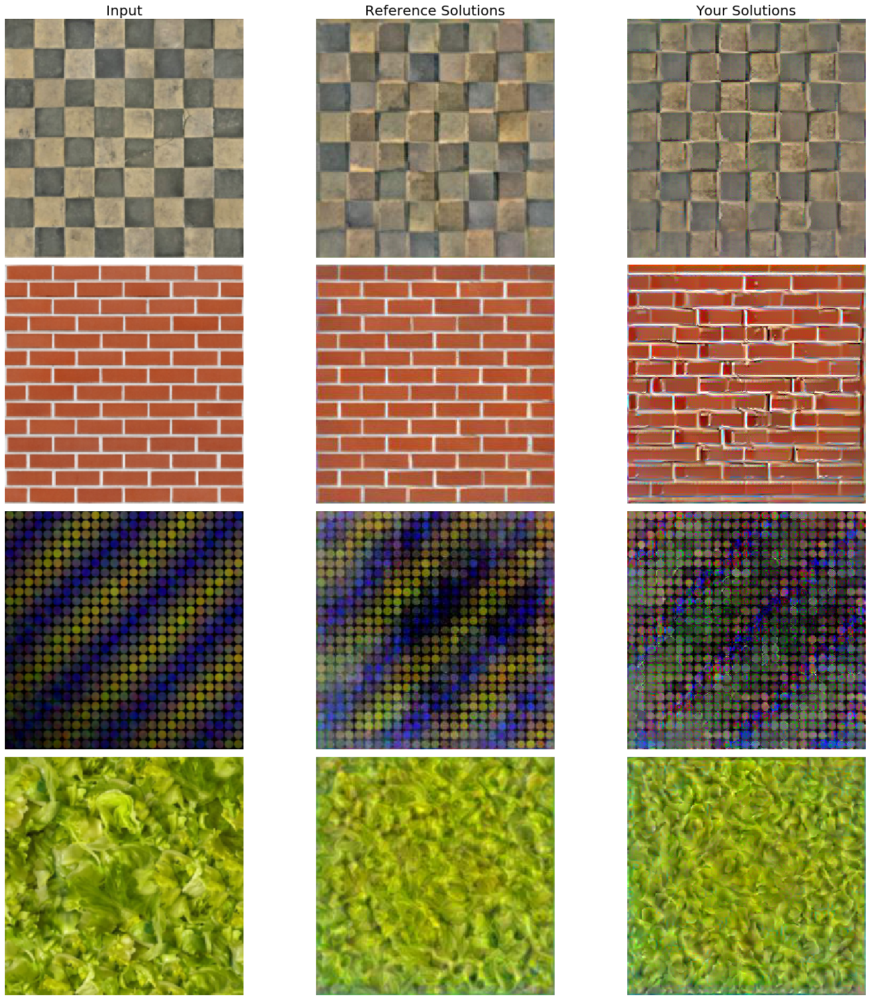

In [73]:
# Comparison to Reference Solution - Do not change anything, just execute to varify correctness of your solution
num_pairs=4
fig, axs = plt.subplots(num_pairs, 3, figsize=(20, 20))

axs[0, 0].set_title('Input', fontsize=20)
axs[0, 1].set_title('Reference Solutions', fontsize=20)
axs[0, 2].set_title('Your Solutions', fontsize=20)

# content and correspoinding style image side-by-side
for row in range(0, num_pairs):
        axs[row, 0].imshow(im_convert(texture[row]))
        axs[row, 1].imshow(im_convert(ref_tex[row]))
        axs[row, 2].imshow(im_convert(target[row]))

        for col in range(0, 3):
            axs[row, col].axis('off')
        
fig.tight_layout()
plt.show()

## Useful Commands
* For the computation of the gram matrix a stretching of each 2d activation map into a vector is required, this can be easily done by applying the [torch.Tensor.view](https://pytorch.org/docs/stable/tensors.html#torch.Tensor.view) command.
* The transpose of a torch matrix can be obtained using [torch.Tensor.transpose](https://pytorch.org/docs/stable/tensors.html?#torch.Tensor.transpose)
* Two torch matrices (tensors with 2 dimensions, a height and a width) can be multiplied using [torch.mm](https://pytorch.org/docs/stable/generated/torch.mm.html). For batch sizes > 1, consider [torch.matmul](https://pytorch.org/docs/stable/generated/torch.matmul.html)
* The scalar mean of an arbitrary shaped tensor can be computed using [torch.mean](https://pytorch.org/docs/stable/generated/torch.mean.html)
* The dimensionality of a tensor (`batch_size`, `num_channels`, `height`, `width`) can be queried using [torch.Tensor.size](https://pytorch.org/docs/stable/tensors.html?highlight=size#torch.Tensor.size)
* A subsection of a Pytorch tensor can be obtained by using the [torch.narrow](https://pytorch.org/docs/stable/generated/torch.narrow.html) command or by referring to the desired subsection with a command similar to `tensor[:, :, 1:, :]`. In this example, one would obtain a slice with the first index of the third dimension removed.

## References


[1]	Gatys, Ecker, and Bethge, “Image Style Transfer Using Convolutional Neural Networks”,
CVPR 2016, [Paper](https://ieeexplore.ieee.org/document/7780634)

[2]	Sendik, and Cohen-Or, “Deep Correlations for Texture synthesis”, Siggraph 2017, [Paper](https://dl.acm.org/citation.cfm?id=3015461)

[3]	torchvision.models, https://pytorch.org/docs/stable/torchvision/models.html

[4]	Gramian Matrix, https://en.wikipedia.org/wiki/Gramian_matrix

[5]	Johnson, Alahi, and Fei-Fei, “Perceptual Losses for Real-Time Style Transfer and Super-Resolution”, ECCV 2016, [Paper](https://arxiv.org/abs/1603.08155)

[6]	Johnson, Alahi, and Fei-Fei, “Perceptual Losses for Real-Time Style Transfer and Super-Resolution: Supplementary Material” [PDF](https://cs.stanford.edu/people/jcjohns/papers/fast-style/fast-style-supp.pdf)

## Appendix A - Details of [1]

Let $N_l$ be the number of feature maps at layer $l$ and let $M_l$ be the number of scalar values in each feature map, hence the height times the width of each feature map at layer $l$. By stretching the $2d$ responses in each feature map into a $1d$ vector, the responses at layer $l$ can therefore be stored in a matrix $F^l \in \mathbb{R}^{N_l \times M_l}$ where $F^l_{ij}$ is the activation value of the $i^{th}$ filter at position $j$ in layer $l$. Let further be $P^l$ and $F^l$ the feature representations of the content image $\vec{p}$ and the target image $\vec{x}$ in layer $l$ respectively.

#### Content Loss

Since we want to keep the content of $\vec{p}$ in our target image $\vec{x}$, it is a reasonable choice to minimize the squared difference between their corresponding activations $P^l$ and $F^l$. Recall that in higher layers of a neural network, detailed pixel information about the input image is usually lost, while information about the high-level content is preserved. In order to preserve the content it is therefore a good idea to choose a layer number corresponding to one of the higher layers $l$ (e.g. corresponding to `conv4_2` in VGG19) to define the content loss $\mathcal{L}_{\textrm{content}}$:


$$ \mathcal{L}_{\textrm{content}} \left( \vec{p}, \vec{x},l \right) = \frac{1}{N_l M_l} \sum_{i,j} \left( F^l_{ij} - P^l_{ij} \right)^2 = \textrm{mean}\left( \left( F^l - P^l \right) \odot \left( F^l - P^l \right) \right)$$

Note that this definition is slightly different from the original paper [1]. It is however highly recommended to take the mean of the sum of squares to be independet to the extent of the respective layer $l$.

##### Gram matrix

In order to preserve the style of the style image a we can not directly compare the feature maps of $\vec{a}$ and $\vec{x}$, but we can (as described in [1]) compare feature correlations which are given by the Gram matrix [4] $G^l \in \mathbb{R}^{N_l \times N_l}$ where $G^l_{ij}$ is the inner product between the vectorised feature maps $i$ and $j$ in layer $l$:

$$G^l_{ij} = \sum_{k} F^l_{ik} F^l_{jk}$$

#### Style Loss

We obtain a multi-scale representation of the style image by taking several layers l into account. Let $A^l$ and $G^l$ be the style representations (given by the corresponding Gram matrix) of the style image $\vec{a}$ and the target image $\vec{x}$ respectively, the contribution of layer $l$ to the style loss can then be defined as

$$ E_l = \frac{1}{N^2_l M^2_l} \sum_{i,j} \left( G^l_{ij} - A^l_{ij} \right)^2 = \frac{1}{M_l^2} \textrm{mean}\left( \left( G^l - A^l \right) \odot \left( G^l - A^l \right) \right) $$

Note that this definition of the style loss is also a bit different from from the paper.

By choosing a suitable weight $w_l$ for each layer $l$ we obtain the style loss $\mathcal{L}_{\textrm{style}}$ as

$$ \mathcal{L}_{\textrm{style}} \left( \vec{a}, \vec{x} \right) = \sum_{l=0}^{L} w_l E_l $$

The total loss is simply a weighted sum of the content loss and the style loss:

$$ \mathcal{L}_{\textrm{total}} \left( \vec{p}, \vec{a}, \vec{x} \right) = \alpha \mathcal{L}_{\textrm{content}} \left( \vec{p}, \vec{x} \right) + \beta \mathcal{L}_{\textrm{style}} \left( \vec{a}, \vec{x} \right) $$

Although this has not to be done in code explicitly, it is highly recommended to verify that the necessary gradients $\frac{\partial \mathcal{L}_{\textrm{content}}}{\partial F^l_{ij}}$ and $\frac{\partial E_l}{\partial F^l_{ij}}$, both with respect to the activations in the layer $l$, can be analytically derived as

$$\frac{\partial \mathcal{L}_{\textrm{content}}}{\partial F^l_{ij}} = \begin{cases} \begin{array}{lr} \frac{2}{N_l M_l} \left( F^l - P^l \right)_{ij} & \textrm{if} \; F^l_{ij}>0 \\ 0 & \textrm{if} \; F^l_{ij} \leq 0 \end{array} \end{cases}$$

$$\frac{\partial E_l}{\partial F^l_{ij}} = \begin{cases} \begin{array}{lr} \frac{2}{N_l^2 M^2_l} \left( \left( F^l \right)^T \left( G^l - A^l \right) \right)_{ji} & \textrm{if} \; F^l_{ij}>0 \\ 0 & \textrm{if} \; F^l_{ij} \leq 0 \end{array} \end{cases}$$

## Appendix B - Details of [2]

The approach presented in [2] is very similar to the method proposed in [1], the main contribution is the computation of the *deep correlation matrices* to obtain results that are similar to the input image both on a local and a global scale. For completeness (and in the case of $E^l_{smooth}$ for error correction), the essential equations of the proposed method are presented in the following.

$$E^l_{smooth} = \frac{1}{2 \sigma} \sum_{i,j,n} \textrm{log} \left( \frac{1}{4} \sum_{\delta i, \delta j} \textrm{exp} \left( -\sigma \cdot \left( f^{l,n}_{i,j} - f^{l,n}_{i + \delta i, j + \delta j} \right)^2 \right) \right)$$

$$E_{smooth} = \sum_{l} w^S_l E^l_{Smoooth}$$

$$  $$